In [26]:
import numpy as np
import matplotlib.pyplot as plt


current_position = 0.0
current_velocity = 0.0
def update_position(current_position, current_velocity, acceleration, delta_time = 1):
    new_velocity = (current_velocity + .5 * acceleration * delta_time)
    new_position = current_position + new_velocity * delta_time
    return new_position, new_velocity


positions = [current_position]
velocities = [current_velocity]
for i in range(10):
    current_position, current_velocity = update_position(
        current_position=current_position, current_velocity=current_velocity, acceleration=1
    )
    positions.append(current_position)
    velocities.append(current_velocity)

# fig, ax = plt.subplots(1,2, figsize = (10, 7))

# ax[0].plot(positions)
# ax[0].set_title('position')

# ax[1].plot(velocities)
# ax[1].set_title('velocity')


In [417]:
from typing import Tuple, List, Callable

def update_position(
        p_t: float, 
        v_t: float, 
        f_t: float, 
        resistance: float,
        mass: float,
        gravity: float,
        landscape_func: Callable[[float], float],
        delta_t: float = 1
    ) -> Tuple[float, float]:
    a_t = calc_acceleration(f_t, v_t, p_t, resistance, mass, gravity, landscape_func)
    v_tplus1 = (v_t + a_t * delta_t)
    p_tplus1 = p_t + v_tplus1 * delta_t
    return p_tplus1, v_tplus1

def calc_acceleration(f_t, v_t, p_t, resistance, mass, gravity, landscape_func, eps=1.0e-6):
    # if abs(v_t) < eps and abs(f_t) < resistance:
    #     return 0.0  # stuck
    friction = resistance * v_t 
    gravity = gravity_force(p_t, mass, landscape_func, g_const=gravity)
    return (gravity + f_t - friction) / mass

def numerical_grad(landscape_func, x, eps=1e-5):
    return (landscape_func(x + eps) - landscape_func(x - eps)) / (2 * eps)

# def gravity_force(x, mass, landscape_func, g_const=9.81):
#     return -mass * g_const * numerical_grad(landscape_func, x)

def gravity_force(x, mass, landscape_func, g_const=9.81):
    s = numerical_grad(landscape_func, x)
    return -mass * g_const * s / np.sqrt(1 + s**2)


class OneDMotionSim:

    def __init__(self, 
                 target_loc: float, 
                 landscape_func: Callable[[float], float] = lambda x: 0.0,
                 mass: float = 1.0,
                 initial_position: float = 0.0, 
                 initial_velocity: float = 0.0,
                 resistance: float = 1.0,
                 gravity: float = 9.81,
                 delta_t: float = 1.0,
                ):
        self.target_loc = target_loc
        self.landscape_func = landscape_func
        self.mass = mass
        self.initial_position = initial_position
        self.initial_velocity = initial_velocity
        self.position = initial_position
        self.velocity = initial_velocity
        self.resistance = resistance
        self.gravity = gravity
        self.delta_t = delta_t

    def reset(self) -> None:
        self.position = self.initial_position
        self.velocity = self.initial_velocity
        distance_from_target = self.calc_distance_from_target(
            p_t = self.position,
            target_loc = self.target_loc
        )
        return self.position, self.velocity, distance_from_target

    def calc_distance_from_target(self, p_t: float, target_loc: float) -> float:
        return np.abs(p_t - target_loc)
    
    def step(self, f_t: float) -> Tuple[float, float]:
        self.position, self.velocity = update_position(
            p_t = self.position,
            v_t = self.velocity,
            f_t = f_t,
            resistance=self.resistance,
            mass = self.mass,
            gravity = self.gravity,
            landscape_func=self.landscape_func,
            delta_t = self.delta_t
        )
        distance_from_target = self.calc_distance_from_target(
            p_t = self.position, target_loc = self.target_loc
        )
        return self.position, self.velocity, distance_from_target



In [421]:

class RandomAgent:

    def act(self, state):
        return np.random.normal(loc=0, scale=1.0, size = 1).item()
    
class OneAndDoneAgent:

    def __init__(self):
        self.t = 0

    def act(self, state):
        if self.t < 3:
            self.t += 1
            return 1.5
        else:
            return 0.0

    
class MPCAgent:

    def __init__(
            self, 
            target_loc: float, 
            num_steps: int, 
            num_rollouts: int, 
            cem_iters: int,
            cem_cutoff: float,
            mass: float,
            resistance: float,
            gravity: float,
            landscape_func: Callable[[float], float],
            delta_t: float
        ):

        self.target_loc = target_loc
        self.num_steps = num_steps
        self.num_rollouts = num_rollouts
        self.cem_iters = cem_iters
        self.cem_cutoff = cem_cutoff

        ## TODO: gives perfect knowledge of the env
        self.mass = mass
        self.resistance = resistance
        self.gravity = gravity
        self.landscape_func = landscape_func
        self.delta_t = delta_t

    def act(self, state):
        self.run_cem_mpc(initial_state=state)
        ## take best, first mean
        return self.means[0]

    def model_dynamics(self, f_t: float, s_t: List[float]):
        """
        Exact model of dynamics
        """
        p_t, v_t = s_t[0], s_t[1]
        p_tplus1, v_tplus1 = update_position(
            p_t, v_t, f_t, 
            mass = self.mass, 
            resistance = self.resistance, 
            gravity = self.gravity,
            landscape_func = self.landscape_func,
            delta_t = self.delta_t
        )
        r_tplus1 = np.abs(p_tplus1 - self.target_loc).item()
        return p_tplus1, v_tplus1, r_tplus1

    def rollout(self, initial_state, actions):
        p_t, v_t = initial_state[0], initial_state[1]
        rollout_reward = 0.0
        for a in actions:
            p_t, v_t, r_t = self.model_dynamics(f_t=a, s_t = [p_t, v_t])
            rollout_reward += -r_t
        return rollout_reward
    
    def run_cem_iter(self, initial_state, actions):

        rewards = np.zeros(self.num_rollouts)
        for i in range(self.num_rollouts):
            rollout_reward = self.rollout(
                initial_state, 
                actions = actions[i,:]
            )
            rewards[i] = rollout_reward
        return rewards
    
    def run_cem_mpc(self, initial_state):
        # re-initialise each time...?
        self.means = np.zeros(self.num_steps)
        self.stds = np.ones_like(self.means)*100

        for _ in range(self.cem_iters):
            actions = (
                np.random.normal(
                    loc=np.repeat(self.means,self.num_rollouts), 
                    scale=np.repeat(self.stds, self.num_rollouts)
                )
            ).reshape(self.num_rollouts, self.num_steps)
            rewards = self.run_cem_iter(initial_state, actions)
            elite_actions = actions[rewards > np.quantile(rewards, self.cem_cutoff), :]

            self.means = elite_actions.mean(axis=0)
            self.stds = elite_actions.std(axis=0)



In [426]:
# agent = RandomAgent()
TARGET = 2.0
MASS = 1.0
RESISTANCE = 0.1
GRAVITY = 9.81
LANDSCAPE_FUNC = lambda x: np.sin(x)
DELTA_T = 0.05

agent = MPCAgent(
    target_loc=TARGET,
    num_steps = 30,
    num_rollouts = 500,
    cem_iters = 5,
    cem_cutoff = .95,
    mass = MASS,
    resistance=RESISTANCE,
    gravity=GRAVITY,
    landscape_func=LANDSCAPE_FUNC,
    delta_t=DELTA_T
)
# agent = OneAndDoneAgent()

# def landscape_func(x):
#     return np.sin(3*x)
env = OneDMotionSim(
    target_loc = TARGET,
    mass = MASS,
    resistance=RESISTANCE,
    landscape_func=LANDSCAPE_FUNC,
    delta_t=DELTA_T
)

p_t, v_t, distance_from_target = env.reset()
num_iters = 50
positions, velocities, actions, rewards = [p_t], [v_t], [], []

for _ in range(num_iters):
    f_t = agent.act([p_t, v_t])
    p_t, v_t, distance_from_target = env.step(f_t=f_t)
    positions.append(p_t), velocities.append(v_t), actions.append(f_t), rewards.append(distance_from_target)


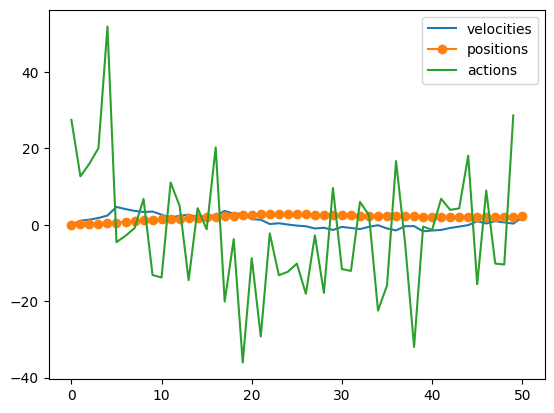

In [427]:
plt.plot(velocities, label='velocities')
plt.plot(positions, marker='o', label='positions')
plt.plot(actions, label='actions')
plt.legend()

In [428]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
from typing import Callable


class MotionViewer:
    def __init__(
        self,
        positions: np.ndarray,
        velocities: np.ndarray,
        landscape_func: Callable[[float], float],
        target_x: float,
        fps: int = 30,
        dt: float = 0.05,
        xlim=None,
    ):
        self.positions = positions
        self.velocities = velocities
        self.landscape_func = landscape_func
        self.target_x = target_x
        self.fps = fps
        self.dt = dt

        # --- x limits ---
        self.xlim = xlim or (
            min(target_x, positions.min()) - 1.0,
            max(target_x, positions.max()) + 1.0,
        )

        # --- sample landscape over full domain ---
        xs = np.linspace(*self.xlim, 1000)
        ys = np.array([self.landscape_func(x) for x in xs])

        # --- y limits with padding ---
        y_pad = 0.1 * (ys.max() - ys.min() + 1e-6)
        self.ylim = (ys.min() - y_pad, ys.max() + y_pad)

        # --- figure ---
        self.fig, self.ax = plt.subplots()
        self.dot, = self.ax.plot([], [], "ko", markersize=8)
        self.ax.axvline(target_x, color="red", linewidth=2)

        # --- landscape ---
        self.ax.plot(xs, ys, color="grey", linewidth=2, alpha=0.8)

        self.ax.set_xlim(*self.xlim)
        self.ax.set_ylim(*self.ylim)
        self.ax.set_yticks([])
        self.ax.set_xlabel("x")

        # --- motion ---
        self.frames = self._interpolate_motion()

        # # --- spinner ---
        # self.spin_radius = 0.05 * (self.ylim[1] - self.ylim[0])
        # self.spin_period = 1.0  # one rotation per 1 unit x
        # self.x0 = self.frames[0] if len(self.frames) > 0 else 0.0

        # self.spinner, = self.ax.plot([], [], "go", markersize=4)

        self.anim = FuncAnimation(
            self.fig,
            self._update,
            frames=len(self.frames),
            interval=1000 / fps,
            blit=True,
        )

    def _interpolate_motion(self):
        frames = []
        substeps = max(1, int(self.fps * self.dt))

        for x0, v in zip(self.positions, self.velocities):
            for i in range(substeps):
                t = (i / substeps) * self.dt
                frames.append(x0 + v * t)

        return np.array(frames)

    def _update(self, i):
        x = self.frames[i]
        y = self.landscape_func(x)

        # black dot
        self.dot.set_data([x], [y])

        # # angle proportional to x displacement
        # theta = 2 * np.pi * (x - self.x0) / self.spin_period

        # # green dot rotates around black dot
        # x_spin = x + self.spin_radius * np.cos(theta)
        # y_spin = y + self.spin_radius * np.sin(theta)

        # self.spinner.set_data([x_spin], [y_spin])

        return (self.dot,)

    def show(self):
        display(HTML(self.anim.to_jshtml()))


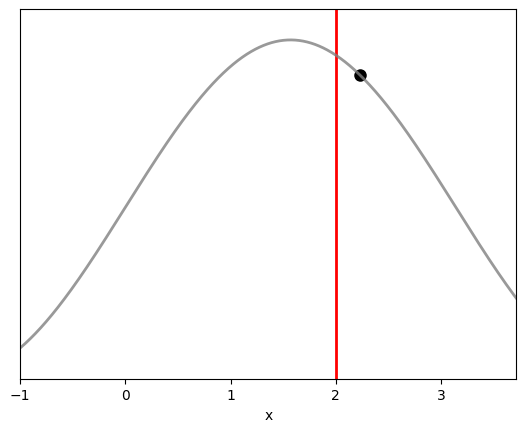

In [430]:
vid = MotionViewer(
    positions = np.array(positions),
    velocities= np.array(velocities),
    target_x = env.target_loc,
    landscape_func=env.landscape_func,
    fps = 300
)

vid.show()

Try to learn the dynamics model online.
Want to predict p_t and calculate the reward.
- online linear regression
- simple thing like thompson sampling?
- GP dynamics model

What about making the environment more complex?
- random jitters in measurement
- add elevation
- two dimensions
- two dimensions with elevation and obstacles

In [283]:
g(1)

array(0)

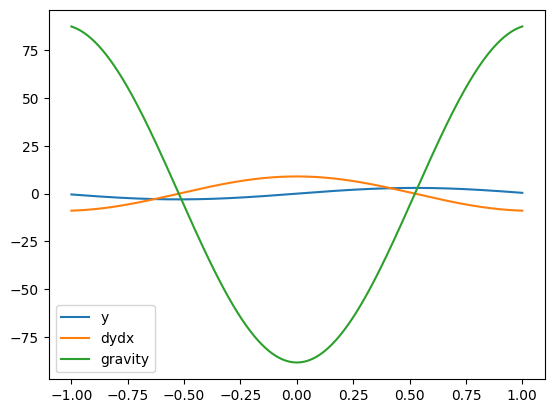

In [289]:
def numerical_grad(g, x, eps=1e-5):
    return (g(x + eps) - g(x - eps)) / (2 * eps)

# def g(x):
#     hill = np.exp(-0.5 * (x - 2)**2)
#     return -2*hill + np.sin(.1*x+1) - np.cos(2*x)
def g(x):
    return 3*np.sin(3*x) - 0.001*np.log(x**2 + 1)

def gravity_force(x, mass, g_const=9.81):
    return -mass * g_const * numerical_grad(g, x)

x = np.linspace(-1, 1, 1000)
y = g(x)
dydx = numerical_grad(g, x)
gravity = gravity_force(x, mass=1)
plt.plot(x, y, label='y')
plt.plot(x, dydx, label='dydx')
plt.plot(x, gravity, label='gravity')
plt.legend()

In [243]:
dydx

array([        nan, -9.98990023, -4.99497505, -3.32998891, -2.49749376,
       -1.99799601, -1.66499723, -1.42714082, -1.24874844, -1.10999877,
       -0.998999  , -0.90818099, -0.83249931, -0.76846095, -0.71357092,
       -0.66599956, -0.62437461, -0.58764671, -0.55499969, -0.5257892 ,
       -0.49949975, -0.47571406, -0.4540907 , -0.43434764, -0.41624983,
       -0.39959984, -0.38423062, -0.36999986, -0.35678559, -0.34448264,
       -0.33299989, -0.32225796, -0.3121874 , -0.30272718, -0.29382344,
       -0.28542849, -0.27749992, -0.26999993, -0.26289467, -0.25615378,
       -0.24974994, -0.24365848, -0.23785709, -0.23232553, -0.2270454 ,
       -0.22199995, -0.21717387, -0.21255315, -0.20812496, -0.20387751,
       -0.19979996, -0.19588231, -0.19211535, -0.18849053, -0.18499997,
       -0.18163633, -0.17839283, -0.17526313, -0.17224135, -0.16932201,
       -0.16649997, -0.16377046, -0.16112901, -0.1585714 , -0.15609373,
       -0.15369228, -0.15136361, -0.14910446, -0.14691174, -0.14